# Projekt z widzenia komputerowego

Kacper Perz, 145261

Łukasz Osiewicz, 147073

Samuel Levi Paszyński, 143057

# Imports and display

In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import itertools
from scipy.signal import convolve2d

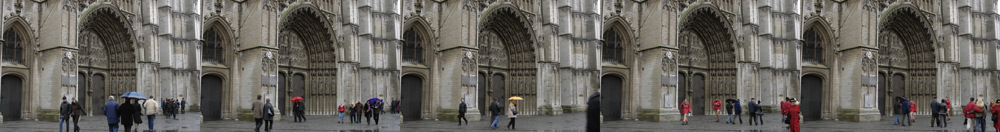

In [2]:
from pathlib import Path
import numpy as np
import cv2
from PIL import Image


def imshow(a):
  a = a.clip(0, 255).astype('uint8')
  if a.ndim == 3:
    if a.shape[2] == 4:
      a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
    else:
      a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
  display(Image.fromarray(a.astype('uint8')))


def display_images(path):
    images = []
    path = Path(path)
    for img in path.glob('*.jpg'):
        images.append(cv2.imread(str(img)))
    imshow(np.concatenate(images, axis=1))

display_images('cathedral/')

In [3]:
image = cv2.imread("cathedral/d001.jpg")
image2 = cv2.imread('cathedral/d002.jpg')
image3 = cv2.imread('cathedral/d003.jpg')
image4 = cv2.imread('cathedral/d004.jpg')
image5 = cv2.imread('cathedral/d005.jpg')

photos = np.array([image, image2, image3, image4, image5])

In [4]:
image.shape == image2.shape == image3.shape == image4.shape == image5.shape

True

In [5]:
image.shape

(500, 752, 3)

In [6]:
gray_photos = np.array([cv2.cvtColor(photo, cv2.COLOR_BGR2GRAY) for photo in photos])
hsv_photos = np.array([cv2.cvtColor(photo, cv2.COLOR_BGR2HSV) for photo in photos])

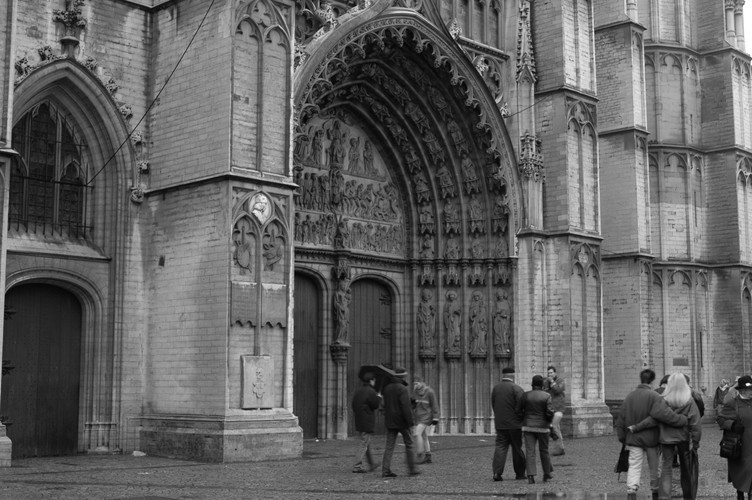

In [7]:
imshow(gray_photos[1])

# Proste operacje

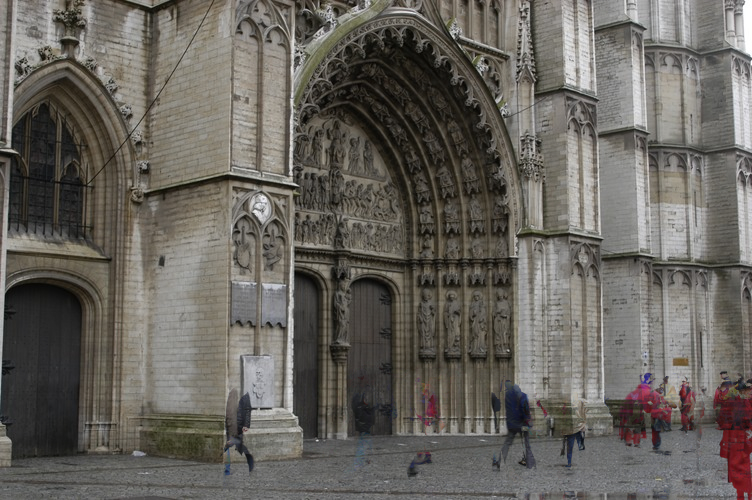

In [8]:
imshow(np.median(photos, axis=0))

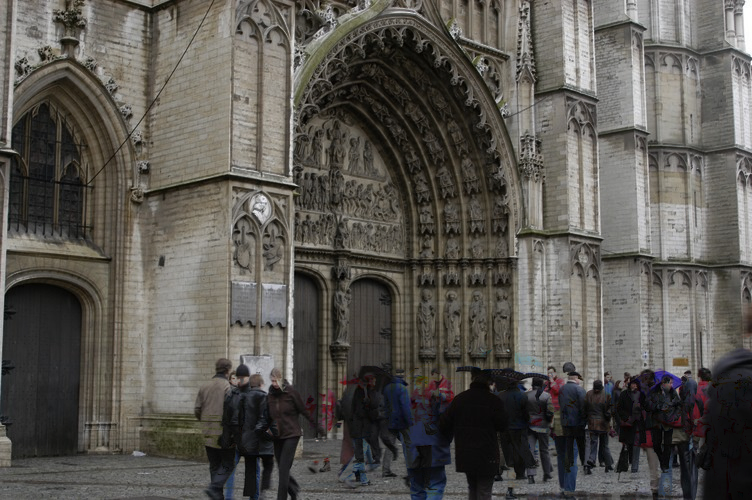

In [9]:
imshow(np.min(photos, axis=0))

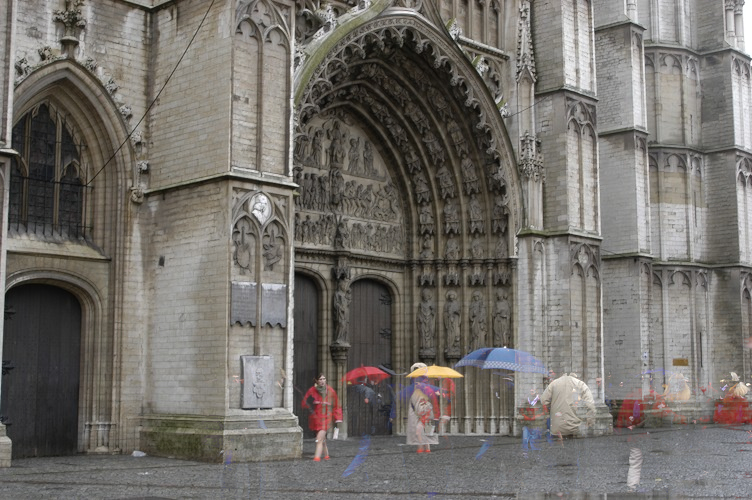

In [10]:
imshow(np.max(photos, axis=0))

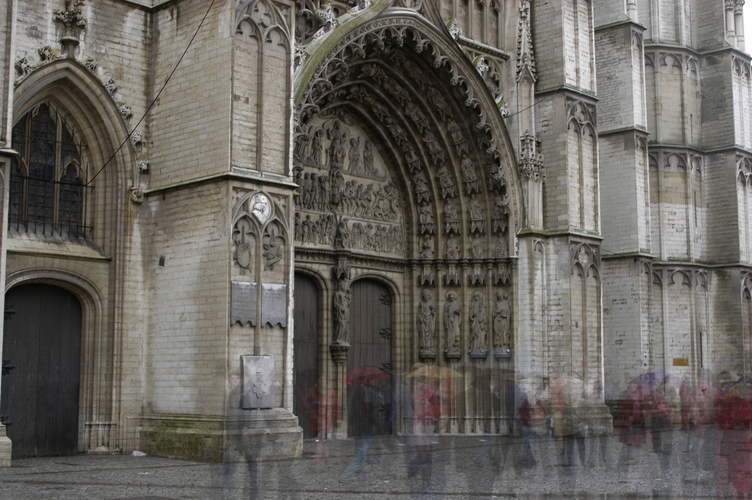

In [11]:
imshow(np.mean(photos, axis=0))

# Najczęściej występujący piksel

Sprawdzamy czy zdjęcia są na siebie nakładalne, czyli czy rzeczywiście tło się nie różni pomiędzy 5 obrazkami. Poniższa komórka, choć badająca tylko jeden kanał uwidacznia, że tło nie jest identyczne między zdjęciami.

In [12]:
how_many = 0
for i in range(500):
    for j in range(725):
        if photos[1][i][j][0] == photos[0][i][j][0] == photos[2][i][j][0] == photos[3][i][j][0] == photos[4][i][j][0]:
            how_many += 1

print(how_many)

print(photos[0, ..., 0] - photos[1, ..., 0]) # ZDJECIA SA ROZNE, COS PIEKNEGO

17
[[253 254   2 ...   0   0   1]
 [254 255   2 ...   4   2   0]
 [  0   1   3 ... 255 253   0]
 ...
 [254   1 255 ... 240 219 201]
 [  5   6   2 ... 238 217 190]
 [252 255 255 ... 239 221 182]]


Pierwszą próbą było policzenie najczęściej występującego piksela na odpowiadającej mu pozycji (i, j) pomiędzy pięcioma zdjęciami. Taki piksel wstawialibyśmy do ilustracji wynikowej, zakładając, że piksele odpowiadające tłu będą najliczniejsze. Niestety, podejście to jest naiwne, ponieważ - zgodnie z powyższymi wnioskami - tła nie są identyczne, wobec czego najczęstszym przypadkiem jest sytuacja, w której unikalny piksel pojawia się tylko raz.

Most frequent RGB value shape: (500, 725, 3)


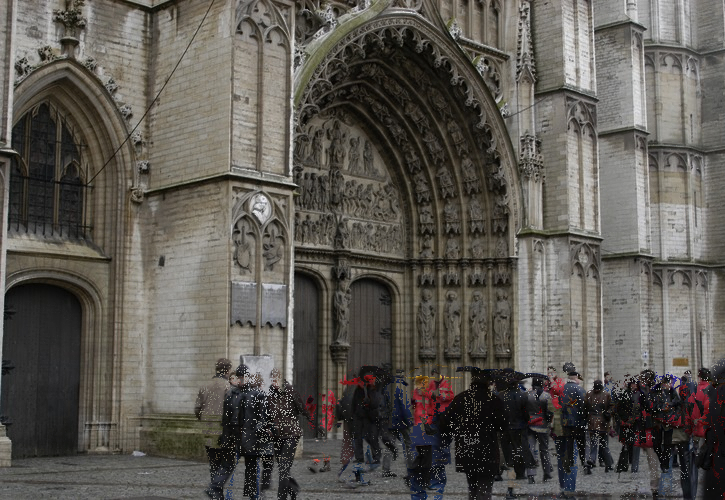

In [13]:
def most_frequent_value(photos): # (5, 500, 725, 3)
    stack_photos = photos
    
    # piksele na wierszach
    stack_pixels = stack_photos.reshape(-1, 3)
    most_frequent_pixel = np.zeros((500, 725, 3), dtype=np.uint8)
    
    for i in range(500):
        for j in range(725):
            # wyjmij wartości RGB na pozycji (i,j) na wszystkich fotkach
            pixel_values = stack_photos[:, i, j, :]
            
            unique_pixels, counts = np.unique(pixel_values, axis=0, return_counts=True)
            
            # znajdź indeks najczęstszej wartości i przypisz
            most_frequent_index = np.argmax(counts)
            most_frequent_pixel[i, j] = unique_pixels[most_frequent_index]
    
    print("Most frequent RGB value shape:", most_frequent_pixel.shape)
    return most_frequent_pixel

imshow(most_frequent_value(photos))

# Piksel najpodobniejszy do swoich odpowiedników

Podejście zbliżone do medianowego. Staraliśmy się odnaleźć najmniej różniący się piksel od swoich odpowiedników na pozycji (i, j) pomiędzy 5 zdjęciami. Tak naprawdę, w idealnych warunkach, tj. z identycznym tłem, podejście z najczęściej występującym pikselem powinno być skuteczniejsze, jednak jak już powiedzieliśmy wcześniej, nie jest to możliwe. Zastosowany blur gaussowski dla drugiej ilustracji nie przynosi większych efektów.

Most similar RGB value shape: (500, 752, 3)
Most similar RGB value shape: (500, 752, 3)


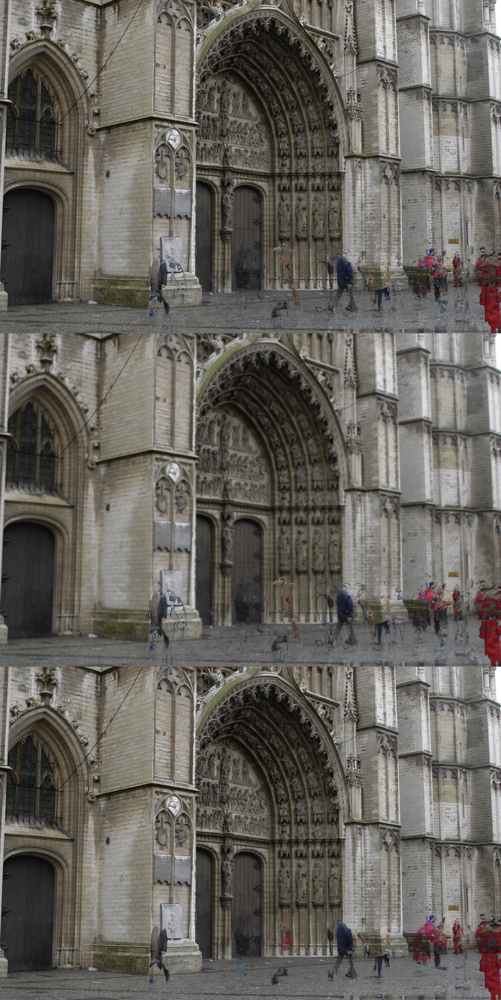

In [14]:
def most_similar_pixel(photos):
    num_photos, num_rows, num_cols, _ = photos.shape
    
    # piksele na wierszach
    stack_pixels = photos.reshape(-1, 3)
    
    most_similar_pixel = np.zeros((num_rows, num_cols, 3), dtype=np.uint8)
    
    for i in range(num_rows):
        for j in range(num_cols):
            # wyjmij wartości RGB na pozycji (i,j) na wszystkich fotkach
            pixel_values = photos[:, i, j, :]
            
            # oblicz odległość między pikselem, a średnią z jego odpowiedników
            squared_diffs = np.sum((pixel_values - np.mean(pixel_values, axis=0))**2, axis=1)
            min_index = np.argmin(squared_diffs)
            
            # wynik przenieś do kopii
            most_similar_pixel[i, j] = pixel_values[min_index]
    
    print("Most similar RGB value shape:", most_similar_pixel.shape)
    return most_similar_pixel

blured_photos = np.array([cv2.GaussianBlur(photo, (3,3), 0) for photo in photos])
imshow(np.concatenate([most_similar_pixel(photos), most_similar_pixel(blured_photos),np.median(photos,axis=0)]))

# Podejście z wykorzystaniem Laplasjana

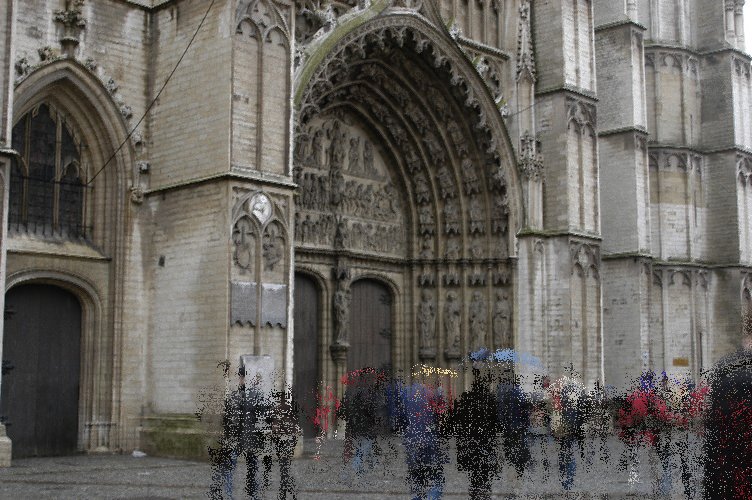

In [15]:
def detect_prec(img):
    # Laplasjans
    g = np.array([
        [0,-1,0],
        [-1,4,-1],
        [0,-1,0]
    ])
    # Szare i krawędzie
    img_grayscale = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) / 255.0
    img_edges = cv2.filter2D(img_grayscale, -1, g)
    img_edges = np.abs(img_edges)
    img_edges = cv2.normalize(img_edges, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    return img_edges


processed_photos = [abs(detect_prec(photo)) for photo in photos]
processed_photos = np.array(processed_photos)

min_indices = np.argmin(processed_photos, axis=0)

final_photo = np.zeros_like(photos[0])

for i in range(len(photos)):
    final_photo[min_indices == i] = photos[i][min_indices == i]
    
imshow(final_photo)

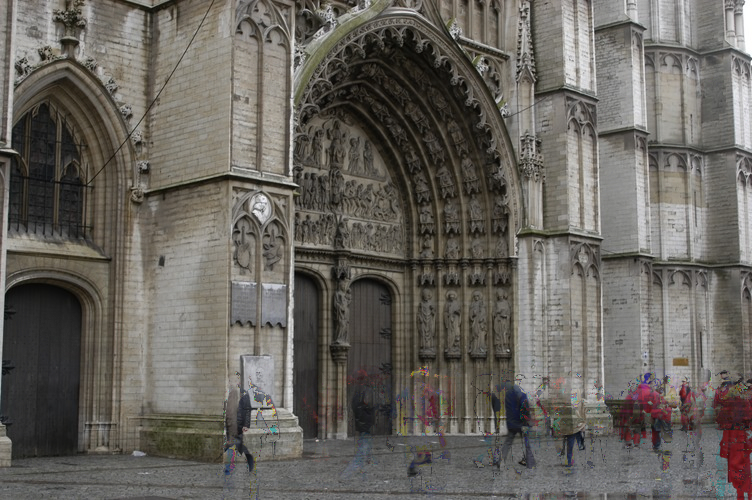

In [16]:
def maximum_likelihood(pixels):
    # Średnia
    mean = np.mean(pixels)

    # Różnica pixela od średniej
    differences = np.abs(pixels - mean)

    # Najmniejsza różnica
    index = np.argmin(differences)

    # Najbardziej zbliżony pixel
    return pixels[index]

stacked_photos = np.stack(photos)
max_likelihood_image = np.apply_along_axis(maximum_likelihood, 0, stacked_photos)
max_likelihood_image = cv2.convertScaleAbs(max_likelihood_image)

imshow(max_likelihood_image)

# Wykorzystanie segmentacji

In [17]:
photos = list(cv2.imread(f"./cathedral/d00{x}.jpg", 1) for x in range(1, 6))

### Segmentacja

- Funkcja segmentation() zwraca różnicę dwóch obrazów. Konieczne jest zastosowanie bluru gaussowskiego o dużych rozmiarach jądra. Jeżeli nie zastosuje się bluru albo gdy zastosujemy za male jądro, funkcja będzie za czula na roznice miedzy obrazami i pokazywać będzie te obszary, które różnią się między sobą minimalnie, a co może wynikać z przesunięcia pozycji slońca, czy też minimalnego ruchu kamery (co ustaliliśmy już w poprzednich częściach notebooka). Obstawiamy jednak ruch slońca, ponieważ brak bluru skutkuje wskazywaniem miejsc na budynku, których wypuklość w realnym świecie powoduje przesunięcie się cienia wraz z ruchem slońca na niebie (umieszczamy ilustrację w ramach ciekawostki na dole).
- Funkcja get_common_mask() tworzy uwspólnioną operacją bitową AND maskę różnić pomiędzy obrazami. Jak widać poniżej całkiem nieźle odseparowuje elementy dynamiczne od statycznego tła, nie licząc pojedynczych kwadratów czerni na budowli.

In [18]:
# tworzy uwspólnioną maskę
def get_common_mask(photos):
    pics = np.stack(photos, axis=3)
    joined_masks  = np.median(pics, axis=3).astype(np.uint8)
    mask = np.zeros(joined_masks.shape)
    all_masks = []

    for idx in range(len(photos) - 1):
        bmask = segmentation(photos[idx], photos[idx + 1])
        res = cv2.bitwise_and(joined_masks, ~bmask)
        res += cv2.bitwise_and(res, bmask)

        joined_masks = res.copy()
        all_masks.append(res)

    return joined_masks, all_masks

# porownuje dwa obrazy i zwraca ich roznice
def segmentation(img1, img2):
    first_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    first_gray = cv2.GaussianBlur(first_gray, (25, 25), 2)

    second_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    second_gray = cv2.GaussianBlur(second_gray, (25, 25), 2)

    diff = cv2.absdiff(second_gray, first_gray)

    thresh = cv2.threshold(diff, 25, 255, cv2.THRESH_BINARY)[1]
    thresh = cv2.dilate(thresh, None, iterations=4)

    bmask = cv2.cvtColor(thresh, cv2.COLOR_GRAY2BGR)

    return bmask

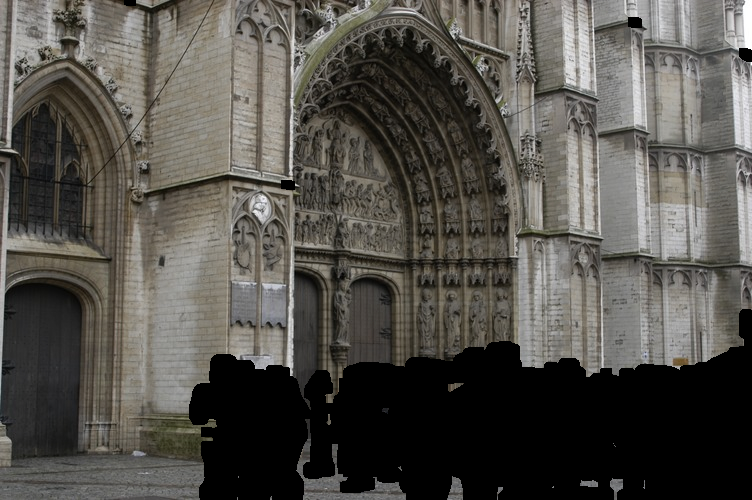

In [19]:
joined_masks = get_common_mask(photos)
imshow(joined_masks[0])

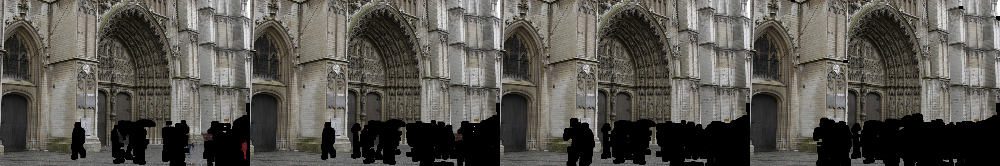

In [20]:
joined_masks = get_common_mask(photos)
imshow(np.concatenate(joined_masks[1], 1))

### MLE

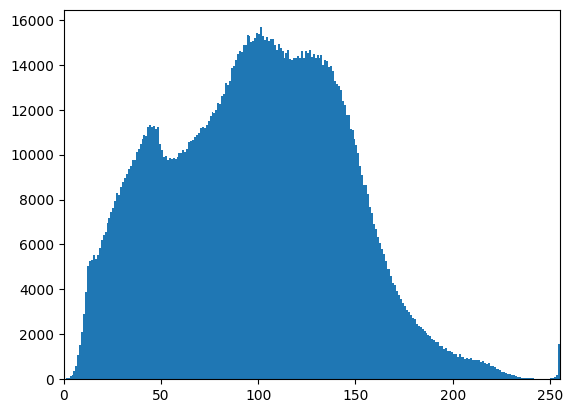

In [21]:
from matplotlib import pyplot as plt
vals = np.array(photos).mean(axis=(3)).flatten()
b, bins, patches = plt.hist(vals, 255)
plt.xlim([0,255])
plt.show()

- Funkcja mle() oblicza Maximum Likelihood Estimation, w naszym wypadku średnią wartość pikseli przy założeniu, że pochodzą z rozkładu Gaussa, a możemy tak założyć, ponieważ rozkład pikseli przypomina rozkład normalny (ilustracja powyżej). Obliczamy macierz kowariancji, a potem jej odwrotność. Obliczamy także odległość piksela od średniej w 3 kanałach, co można interpretować jako prawdopodobieństwo wystąpienia jego wartości. Potem już tylko podstawiamy do wzoru na rozkład normalny i obliczamy rzeczywiste prawdopodobieństwo.
- Używając funkcji get_result() sprawdzamy czy czerń należy do tła, czy nie. Używamy tego odgórnie przyjętego przez nas thresholdu. Jeżeli jest mała szansa na to, że piksel powinien być czarny, to zastępujemy go tłem.


Źródło: https://en.wikipedia.org/wiki/Maximum_likelihood_estimation (dział: Continuous distribution, continuous parameter space)

In [22]:
def mle(img):
    # średnie kolory pikseli w 3 kanalach
    mean = img.reshape(-1, 3).mean(axis=0)

    # kowariancja między pikselami
    cov = np.cov(img.reshape(-1, 3), rowvar=False, bias=True)

    # odwrotność macierzy cov
    cov_inv = np.linalg.inv(cov)

    # jak daleko dany obraz jest od średniej w 3 kanalach rgb
    distance = img - mean
    
    # sumujemy po axis=2 dla prob i axis=1 dla cov_inv i mnożymy macierze
    vectorized = np.tensordot(distance, cov_inv, axes=([2],[1]))
    return np.exp(np.einsum('ijk,ijk->ij', -0.5 * distance, vectorized))

def get_probs(photos):
    probs = []
    for img in photos:
        probs.append(mle(img))

    probs = np.array(probs)
    probs = probs.reshape(len(probs), -1, 1)

    return probs

def get_result(photos, joined_masks):
    final_img = joined_masks.copy().reshape(-1, 3)
    probs = get_probs(photos)

    for idx, img in enumerate(photos):
        img = img.reshape(-1, 3)
        # chyba najlepiej z taka wartoscia, dobrane eksperymentalnie
        final_img = np.where((final_img == 0) & (probs[idx] > 0.2), img, final_img)

    return final_img.reshape(photos[0].shape)

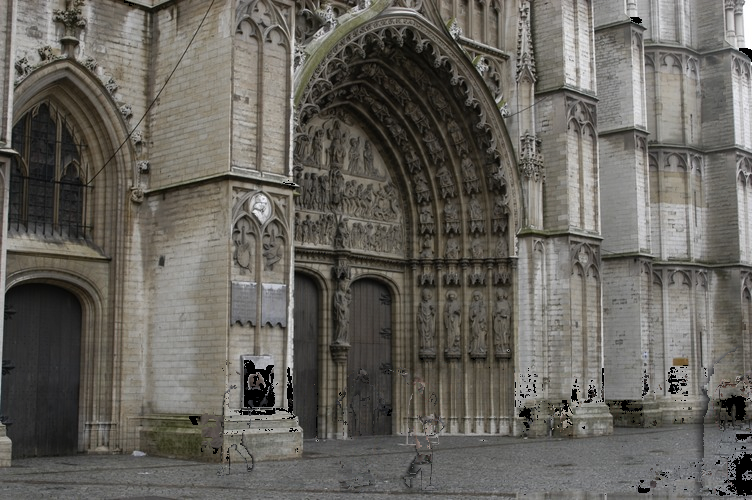

In [23]:
probs = get_probs(photos)
final_img = get_result(photos, joined_masks[0])
imshow(final_img.reshape(photos[0].shape))

### Czyszczenie tła

Funkcja fill_image ma proste zadanie - znaleźć piksel z czystą czernią na dotychczas otrzymanym obrazku wynikowym i zastąpić go odpowiadającym mu pozycją pikselem o kolorach tła, wcześniej zapisanym w background_colors. Rozwiązanie jest całkiem niezłe, ale nie jest idealne, wciąż widać zacienione zarysy dawnych postaci.

In [24]:
def get_background_colors(photos):
    background_colors = list()

    # iteruje po wszystkich parach
    for idx, img in enumerate(itertools.combinations(photos, 2)):
        # tworzymy maskę, gdzie czerń symbolizuje różnicę między obrazami
        mask = segmentation(img[0], img[1])

        # sprawdzamy, które piksele są czarne
        black_color_mask = np.all(mask == [0, 0, 0], axis=-1)

        # zapisujemy z kazdego obrazka te piksele, ktore tworza czyste tlo
        mask_applied_0 = np.where(black_color_mask[:, :, np.newaxis] == 0, 0, img[0])
        mask_applied_1 = np.where(black_color_mask[:, :, np.newaxis] == 0, 0, img[1])

        background_colors.append(mask_applied_0.reshape(-1, 3))
        background_colors.append(mask_applied_1.reshape(-1, 3))

    background_colors = np.array(background_colors).reshape(-1, 3)

    background_colors = set(tuple(x) for x in background_colors)
    background_colors.remove((0, 0, 0))

    return background_colors

def fill_image(photos, final_img, background_colors):   
    final_img = final_img.reshape(-1, 3)
    for idx, img in enumerate(photos):
      img = img.reshape(-1, 3)
      for pix in range(img.shape[0]):
        if list(final_img[pix]) == [0, 0, 0] and tuple(img[pix]) in background_colors:
            final_img[pix] = img[pix]

    return final_img.reshape(photos[0].shape)

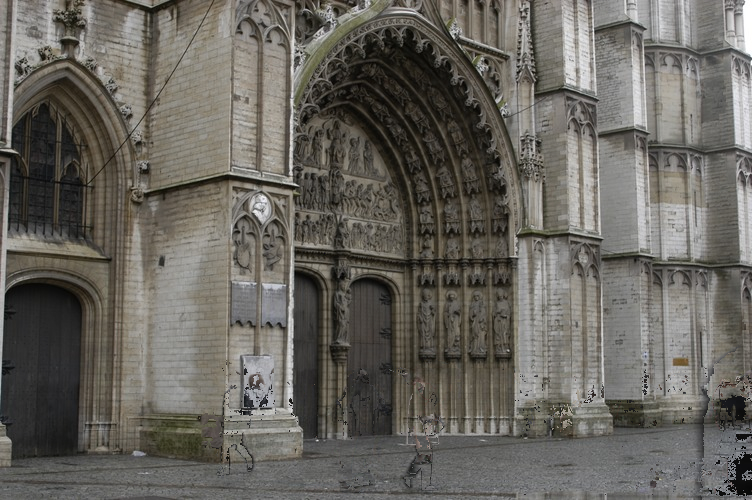

In [25]:
background_colors = get_background_colors(photos)
final_img = fill_image(photos, final_img, background_colors)
imshow(final_img)

In [26]:
np.sum(np.sum(final_img, axis=-1) == 0)

0

**Wniosek dotyczący ostatniej ilustracji:**
Jak wskazuje na to powyższa komórka, elementy, które gołym okiem odbieramy jako czarne, nie są rzeczywiście czarne w reprezentacji RGB, przez co nie zostały zastąpione kolorami tła.

# Dodatkowe ilustracje

In [27]:
def segmentation(img1, img2):
    first_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    first_gray = cv2.GaussianBlur(first_gray, (3, 3), 2)

    second_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    second_gray = cv2.GaussianBlur(second_gray, (3, 3), 2)

    diff = cv2.absdiff(second_gray, first_gray)

    thresh = cv2.threshold(diff, 25, 255, cv2.THRESH_BINARY)[1]
    thresh = cv2.dilate(thresh, None, iterations=4)

    bmask = cv2.cvtColor(thresh, cv2.COLOR_GRAY2BGR)

    return bmask

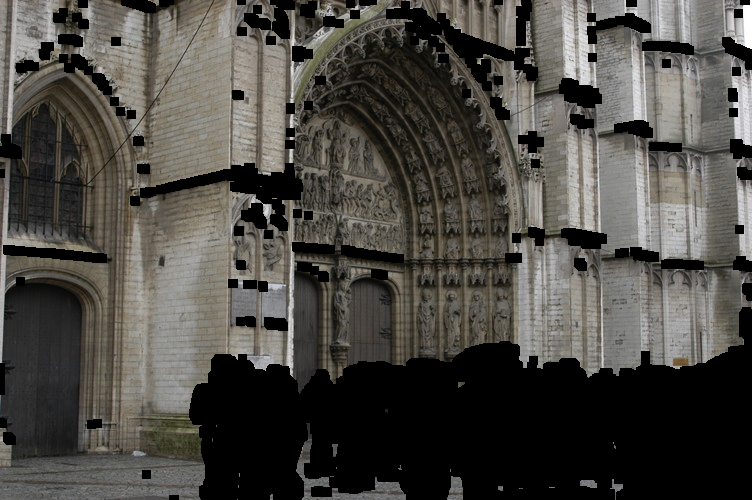

In [28]:
joined_masks = get_common_mask(photos)
imshow(joined_masks[0])

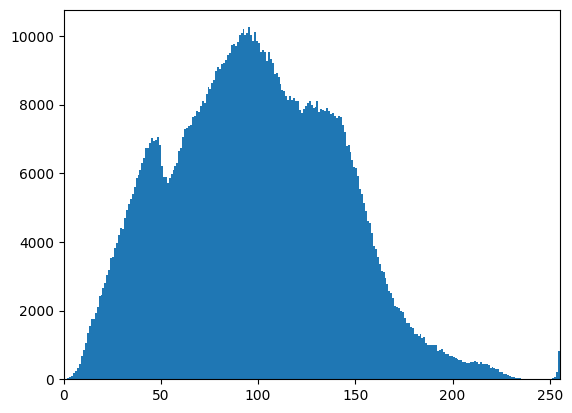

In [29]:
vals = np.array(photos).mean(axis=(0)).flatten()
b, bins, patches = plt.hist(vals, 255)
plt.xlim([0,255])
plt.show()